## Data cleaning and EDA

In [100]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import re
import pickle
import datetime
import numpy as np
from collections import Counter
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import plotly.graph_objs as go
import cufflinks
pd.options.display.max_columns = 30
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [54]:
movies = pd.read_json('../IMDB/IMDB_movie_details.json', lines=True)
reviews = pd.read_json('../IMDB/IMDB_reviews.json', lines=True)
movie_titles = pd.read_csv('../IMDB/IMDB movies.csv')

### Cleaning and examining Movies dataset

In [110]:
print(movies.shape)
movies.head(2)

(1572, 7)


,movie_id,plot_summary,duration,genre,movie_rating,release_date,plot_synopsis
0,tt0105112,"Former CIA analyst, Jack Ryan is in England wi...",1h 57min,"[Action, Thriller]",6.9,1992-06-05,"Jack Ryan (Ford) is on a ""working vacation"" in..."
1,tt1204975,"Billy (Michael Douglas), Paddy (Robert De Niro...",1h 45min,[Comedy],6.6,2013-11-01,Four boys around the age of 10 are friends in ...


In [111]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1572 entries, 0 to 1571
Data columns (total 7 columns):
movie_id         1572 non-null object
plot_summary     1572 non-null object
duration         1572 non-null object
genre            1572 non-null object
movie_rating     1572 non-null float64
release_date     1572 non-null object
plot_synopsis    1572 non-null object
dtypes: float64(1), object(6)
memory usage: 98.2+ KB


Some of the movie_id has punctuations, remove them as they might be keying errors

In [112]:
movies['movie_id'].unique()

array(['tt0105112', 'tt1204975', 'tt0243655', ..., 'tt5013056',
       'tt0104014', 'tt0114142'], dtype=object)

In [113]:
movies['movie_id'] = movies['movie_id'].str.replace('[^\w\s]','')
movies['movie_id'].unique()

array(['tt0105112', 'tt1204975', 'tt0243655', ..., 'tt5013056',
       'tt0104014', 'tt0114142'], dtype=object)

Renaming rating into movie_rating before concatinating it with reviews 

In [114]:
movies.rename(columns={'rating':'movie_rating'},inplace=True)
movies.head(2)

,movie_id,plot_summary,duration,genre,movie_rating,release_date,plot_synopsis
0,tt0105112,"Former CIA analyst, Jack Ryan is in England wi...",1h 57min,"[Action, Thriller]",6.9,1992-06-05,"Jack Ryan (Ford) is on a ""working vacation"" in..."
1,tt1204975,"Billy (Michael Douglas), Paddy (Robert De Niro...",1h 45min,[Comedy],6.6,2013-11-01,Four boys around the age of 10 are friends in ...


Removing duplicates

In [60]:
movies = movies.loc[movies.astype(str).drop_duplicates().index]

Combine plot_summary with plot_synopsis

In [115]:
movies['plot'] = movies['plot_summary'] + movies['plot_synopsis']

In [156]:
movies.to_csv('../IMDB/movie_cleaned.csv')

### Cleaning and examining Review dataset

In [117]:
print(reviews.shape)
reviews.head(2)

(573913, 7)


,review_date,movie_id,user_id,is_spoiler,review_text,user_rating,review_summary
0,10 February 2006,tt0111161,ur1898687,True,"In its Oscar year, Shawshank Redemption (writt...",10,A classic piece of unforgettable film-making.
1,6 September 2000,tt0111161,ur0842118,True,The Shawshank Redemption is without a doubt on...,10,Simply amazing. The best film of the 90's.


Renaming ratings to user_ratings before concatinating

In [118]:
reviews.rename(columns={'rating':'user_rating'},inplace=True)

Remove punctuations in movie_id like we did for movie dataset

In [119]:
reviews['movie_id'] = reviews['movie_id'].str.replace('[^\w\s]','') 

In [120]:
reviews['is_spoiler'].value_counts()

False    422989
True     150924
Name: is_spoiler, dtype: int64

Removing duplicates

In [65]:
reviews = reviews.loc[reviews.astype(str).drop_duplicates().index]

**We will map our spoilers to 1 and 0**

In [126]:
review_cleaned['is_spoiler']=review_cleaned['is_spoiler'].map({True: 1, False:0})

Combine review_text and review_summary, dropping unwanted columns before saving to csv file (to decrease the file size)

In [121]:
reviews['review'] = reviews['review_text'] + reviews['review_summary']

In [122]:
review_cleaned = reviews.drop(columns=['review_text','review_summary','user_id','review_date'])

In [155]:
review_cleaned.to_csv('../IMDB/review_cleaned.csv')

### Cleaning and examining movie titles dataset

In [129]:
movie_titles.shape

(81273, 2)

In [130]:
movie_titles[movie_titles['title'] != movie_titles['original_title']].head(2)

KeyError: 'title'

#### We will only keep the following features:
- imdb_title_id (will be renamed to 'movie_id')
- title: movie title in english (will be renamed to movie title) 
    - Original title: title in their original language, so we will not keep this

In [68]:
movie_titles = movie_titles[['imdb_title_id', 'title']]

In [69]:
movie_titles = movie_titles.rename(columns={'imdb_title_id':'movie_id', 'title':'movie_title'})

Removing duplicates

In [70]:
movie_titles.drop_duplicates(inplace=True)

In [154]:
movie_titles.to_csv('../IMDB/movie_titles_cleaned.csv')

### Merging Titles into df for EDA (reviews & movies merged)

In [132]:
data = pd.merge(reviews, movies, on='movie_id')

In [133]:
print(data.shape)
data.head(2)

(573913, 15)


,review_date,movie_id,user_id,is_spoiler,review_text,user_rating,review_summary,review,plot_summary,duration,genre,movie_rating,release_date,plot_synopsis,plot
0,10 February 2006,tt0111161,ur1898687,True,"In its Oscar year, Shawshank Redemption (writt...",10,A classic piece of unforgettable film-making.,"In its Oscar year, Shawshank Redemption (writt...",Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker...",Chronicles the experiences of a formerly succe...
1,6 September 2000,tt0111161,ur0842118,True,The Shawshank Redemption is without a doubt on...,10,Simply amazing. The best film of the 90's.,The Shawshank Redemption is without a doubt on...,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker...",Chronicles the experiences of a formerly succe...


Checking if there're any **movie_ids in titles** that are not present in **movie_id in df**.   
After research we found out that these are mainly TV series so we can afford to remove them from our dataframe

In [134]:
data[data['movie_id'].isin(movie_titles['movie_id'])==False]['movie_id'].value_counts()

tt4574334    712
tt1837492    600
tt2661044    558
tt0460681    532
tt2193021    526
tt0455275    511
tt0773262    489
tt1475582    447
tt2356777    377
tt0475784    346
tt1796960    303
tt1405406    287
tt2741602    282
tt3749900    263
tt0436992    258
tt5296406    221
tt1578873    184
tt0106179    184
tt0452046    168
tt3205802    165
tt4474344    164
tt5420376    145
tt0364845    131
tt3920596    130
tt3647998    126
tt0491738    125
tt2632424    119
tt5753856     95
tt1378167     89
tt4047038     88
tt0203259     84
tt6048596     75
tt1936532     53
tt2452242     25
tt6868216     13
Name: movie_id, dtype: int64

In [135]:
df = pd.merge(data, movie_titles, on='movie_id')

In [136]:
df['release_date'] = pd.to_datetime(df['release_date'])

In [137]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 565038 entries, 0 to 565037
Data columns (total 16 columns):
review_date       565038 non-null object
movie_id          565038 non-null object
user_id           565038 non-null object
is_spoiler        565038 non-null bool
review_text       565038 non-null object
user_rating       565038 non-null int64
review_summary    565038 non-null object
review            565038 non-null object
plot_summary      565038 non-null object
duration          565038 non-null object
genre             565038 non-null object
movie_rating      565038 non-null float64
release_date      565038 non-null datetime64[ns]
plot_synopsis     565038 non-null object
plot              565038 non-null object
movie_title       565038 non-null object
dtypes: bool(1), datetime64[ns](1), float64(1), int64(1), object(12)
memory usage: 69.5+ MB


#### Seeing starting which year has a higher number of reviews , and we can remove the rest of the reviews before that 

In [138]:
df['release_date'].dt.year.iplot(
    kind='hist',
    xTitle='Year',
    linecolor='black',
    yTitle='count',
    colorscale='ggplot',
    title='Movie Released Date');

In [139]:
df = df[df['release_date'].dt.year > 1990]

In [140]:
df.reset_index(drop=True, inplace=True)

### Exploring the different movie genres

#### Top 15 movie genres with the most spoilers

In [141]:
df['genre_str'] = [str(i).strip('[]') for i in df['genre']]
top_movies_list = list(df['genre_str'].value_counts()[:15].index)
top_movies = df[df['genre_str'].isin(top_movies_list)]
top_movies = top_movies[top_movies['is_spoiler']==1]

In [142]:
top_movies['genre_str'].iplot(                    
    kind='hist',
    xTitle='Genre',
    linecolor='black',
    yTitle='count',
    colorscale='ggplot',
    title='Movie Genre with most spoiler reviews',
    tickangle=75);

**['Action', 'Adventure', 'Sci-Fi'] seems like the movie genre with the most spoilers, also reflects it as being one of the most popular genre**

#### Top 15 "'Action', 'Adventure', 'Sci-Fi'" movies

In [143]:
df[df['genre_str'] == (top_movies_list[0])]['movie_title'].value_counts()[:15]

Batman v Superman: Dawn of Justice    747
Serenity                              744
Jurassic World                        742
Spider-Man 3                          740
Spider-Man: Homecoming                737
Mad Max: Fury Road                    736
Guardians of the Galaxy Vol. 2        733
Superman Returns                      731
Transformers: Age of Extinction       730
Rogue One                             729
Transformers                          728
Pacific Rim                           728
Edge of Tomorrow                      726
Guardians of the Galaxy               726
The Amazing Spider-Man                725
Name: movie_title, dtype: int64

#### 15 movies with least spoilers

In [144]:
lower_movies_list = list(df['genre_str'].value_counts()[-15:].index)
lower_movies_df = df[df['genre_str'].isin(lower_movies_list)]

In [145]:
lower_movies_df['genre_str'].iplot(                    
    kind='hist',
    xTitle='Year',
    linecolor='black',
    yTitle='count',
    colorscale='ggplot',
    title='Movie Released Date',
    tickangle=75);

**['Family','Fantasy','Music'] has the lowest spoilers, it might be because they have lesser reviews**

**Most of the movies genre with lowest spoilers only has one movie**

In [146]:
lower_movies_df['movie_title'].value_counts()

Powder                         115
The People Under the Stairs    103
The Cutting Edge               103
Little Women                    96
The Bodyguard                   96
The Nutty Professor             72
Rare Exports                    69
Miracle on 34th Street          59
Airheads                        55
White Men Can't Jump            54
Go with Me                      42
3 Ninjas                        34
The Jungle Book                 32
Christmas Inheritance           18
The Nutcracker                  12
Name: movie_title, dtype: int64

### User ratings and its association with spoiler reviews

In [147]:
df[df['is_spoiler']==1]['user_rating'].iplot(                    
    kind='hist',
    xTitle='User ratings',
    linecolor='black',
    yTitle='Count',
    colorscale='ggplot',
    title='Spoiler review user ratings');

#### We can infer from below that reviews which are spoilers either have ratings above 8 or 1 (lowest), these people might have really liked the movie and wants to share their thoughts on the plot with the rest, or they might have been really disappointed by the movie.

#### Let's look at them as a whole

In [148]:
ratings = sorted(df['user_rating'].unique())
spoiler_rating = df[df['is_spoiler']==1]['user_rating'].value_counts().sort_index()
non_spoiler_rating = df[df['is_spoiler']==0]['user_rating'].value_counts().sort_index()

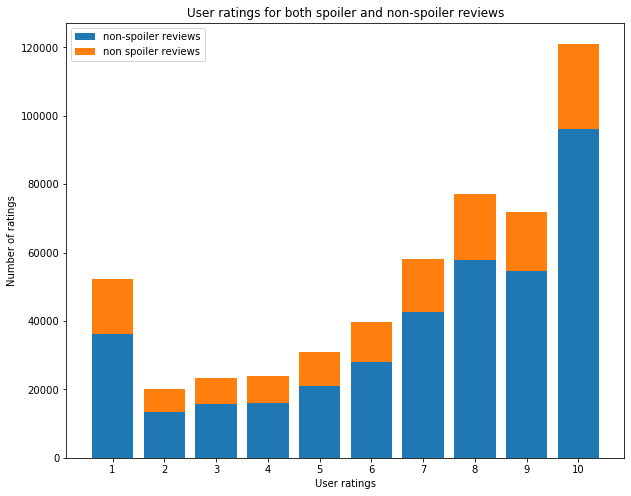

In [149]:
plt.figure(figsize=(10,8))
plt.bar(ratings, non_spoiler_rating)
plt.bar(ratings, spoiler_rating, bottom=non_spoiler_rating)
plt.xticks(ratings)
plt.xlabel('User ratings')  
plt.ylabel('Number of ratings')
plt.title('User ratings for both spoiler and non-spoiler reviews')
plt.legend(['non-spoiler reviews','non spoiler reviews'])
plt.show();

### Removing movies with less than 100 reviews

In [150]:
low_move_counts = df['movie_id'].value_counts()
movies_to_remove = low_move_counts[low_move_counts <=100].index
df = df[~df['movie_id'].isin(movies_to_remove)]

In [151]:
df.reset_index(drop=True, inplace=True)

In [152]:
print(df.shape)
df.head(2)

(508204, 17)


,review_date,movie_id,user_id,is_spoiler,review_text,user_rating,review_summary,review,plot_summary,duration,genre,movie_rating,release_date,plot_synopsis,plot,movie_title,genre_str
0,10 February 2006,tt0111161,ur1898687,True,"In its Oscar year, Shawshank Redemption (writt...",10,A classic piece of unforgettable film-making.,"In its Oscar year, Shawshank Redemption (writt...",Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker...",Chronicles the experiences of a formerly succe...,The Shawshank Redemption,"'Crime', 'Drama'"
1,6 September 2000,tt0111161,ur0842118,True,The Shawshank Redemption is without a doubt on...,10,Simply amazing. The best film of the 90's.,The Shawshank Redemption is without a doubt on...,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker...",Chronicles the experiences of a formerly succe...,The Shawshank Redemption,"'Crime', 'Drama'"


### Word cloud for all reviews

There are 258984157 words in the combination of all spoiler reviews.


<Figure size 936x720 with 0 Axes>

(-0.5, 399.5, 199.5, -0.5)

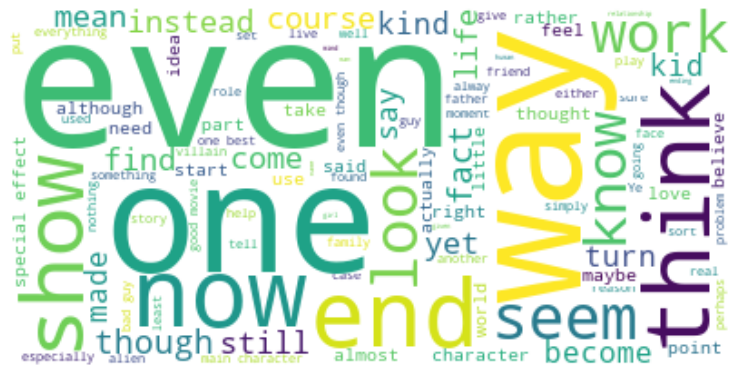

In [69]:
sl = " ".join(posts for posts in df[df['is_spoiler']==1]['review'])
print ("There are {} words in the combination of all spoiler reviews.".format(len(sl)))

stopwords = set(STOPWORDS)

wordcloud_sl = WordCloud(stopwords=stopwords, background_color="white", max_words=100).generate(sl)

plt.figure(figsize=[13,10])
plt.imshow(wordcloud_sl, interpolation='bilinear')
plt.axis("off")
plt.savefig("../imgs/sl_wordcloud.png", format="png")
plt.show();

**For word cloud in the spoiler reviews**
- Many words that expresses their feelings like seem, show, think, know, end, maybe, believe, find etc
- People wants to express how they felt about the movie and their interpretation of the movie itself

There are 503208467 words in the combination of all spoiler reviews.


<Figure size 936x720 with 0 Axes>

(-0.5, 399.5, 199.5, -0.5)

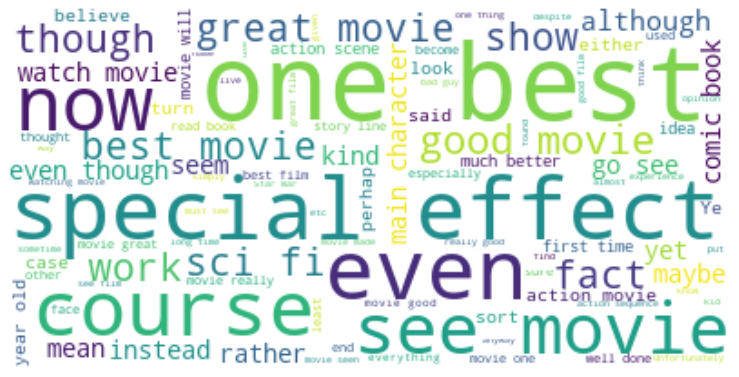

In [70]:
nsl = " ".join(posts for posts in df[df['is_spoiler']==0]['review'])
print ("There are {} words in the combination of all spoiler reviews.".format(len(nsl)))

stopwords = set(STOPWORDS)

wordcloud_nsl = WordCloud(stopwords=stopwords, background_color="white", max_words=100).generate(nsl)

plt.figure(figsize=[13,10])
plt.imshow(wordcloud_nsl, interpolation='bilinear')
plt.axis("off")
plt.savefig("../imgs/nsl_wordcloud.png", format="png")
plt.show();

**For word cloud in the non-spoiler reviews**
- words like complimenting the movie good movie, special effect, sci fi, great movie, action scene, main character etc
- People who likes the movie are less likely to spoil the movie in their reviews
 